**Connessione al Drive, installazione pacchetti e librerie**

In [ ]:
pip install git+https://github.com/lucasb-eyer/pydensecrf.git

In [ ]:
pip install optuna

In [ ]:
#COLLEGAMENTO ALLA CARTELLA DRIVE, QUESTO NON FUNZIONERA' FACENDO GIRARE IL CODICE IN LOCALE
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#IMPORTAZIONE DELLE LIBRERIE

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import cv2
import pickle
import tensorflow as tf
import os
import xgboost as xgb
import numpy as np

from PIL import Image
from keras.models import Sequential, Model
from keras.layers import Conv2D, UpSampling2D
from PIL import Image
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from tensorflow.keras.layers import Concatenate
from keras.applications import ResNet50

import optuna
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


Dimensione e percorsi delle immagini e delle maschere

In [ ]:
#Resize images (height  = X, width = Y)

SIZE_X = 1024
SIZE_Y = 1024

path_images = "/content/drive/MyDrive/Segmentazione/Immagini"
path_masks = "/content/drive/MyDrive/Segmentazione/Maschere"

**Caricamento di immagini e maschere**

In [ ]:
train_images_raw = []

for directory_path in glob.glob(path_images):
    for img_path in glob.glob(os.path.join(directory_path, "*.png")):
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        #img = cv2.resize(img, (SIZE_Y, SIZE_X))
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        img = img / 127.5 - 1  # Normalizzazione tra -1 e 1
        train_images_raw.append(img)
        #train_labels.append(label)
#Convert list to array for machine learning processing
train_images = np.array(train_images_raw)
print("immagini: " , train_images.shape)

train_masks = []
for directory_path in glob.glob(path_masks):
    for mask_path in glob.glob(os.path.join(directory_path, "*.tif")):
        mask = Image.open(mask_path)
        mask = np.array(mask)
        #mask = mask.astype(np.uint8)
        #mask = cv2.resize(mask, (SIZE_Y, SIZE_X))
        #mask = cv2.cvtColor(mask, cv2.COLOR_RGB2BGR)
        train_masks.append(mask)
        #train_labels.append(label)
#Convert list to array for machine learning processing
train_masks = np.array(train_masks)
print("maschere: " , train_masks.shape)

#Use customary x_train and y_train variables
X_train = train_images
y_train = train_masks


immagini:  (14, 1024, 1024, 3)
maschere:  (14, 1024, 1024)


**Caricamento dei modelli e estrazione features**

In [ ]:
# Funzione per dividere i dati in batch
def batch_generator(data, batch_size):
    for i in range(0, len(data), batch_size):
        yield data[i:i + batch_size]

# Parametri di input
batch_size = 3  # Scegli un batch size appropriato

# Carica il modello VGG16 senza strati fully connected
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(SIZE_X, SIZE_Y, 3))
for layer in base_model.layers:
    layer.trainable = False

layer_names = ['block1_conv2', 'block2_conv2']
encoder_outputs = [base_model.get_layer(name).output for name in layer_names]
encoder_model = Model(inputs=base_model.input, outputs=encoder_outputs)

# Elaborazione in batch
all_features = []
all_labels = []

for batch_X, batch_y in zip(batch_generator(X_train, batch_size), batch_generator(y_train, batch_size)):
    block1, block2 = encoder_model(batch_X)
    block2_upsampled = tf.image.resize(block2, size=block1.shape[1:3])
    fused_features = Concatenate()([block1, block2_upsampled])

    # Converti a numpy e ridimensiona
    features_reshaped = fused_features.numpy().reshape(-1, fused_features.shape[3])
    labels_reshaped = batch_y.reshape(-1)

    # Filtra i pixel con label 0
    mask = labels_reshaped != 0
    features_filtered = features_reshaped[mask]
    labels_filtered = labels_reshaped[mask]

    # Accoda i risultati
    all_features.append(features_filtered)
    all_labels.append(labels_filtered)

# Combina i batch elaborati
X_for_RF = np.vstack(all_features)
Y_for_RF = np.hstack(all_labels) - 1  # Sottrai 1 se necessario


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# OTTIMIZZAZIONE DEI PARAMETRI PER TRAINING DEL MODELLO

X_train, X_val, y_train, y_val = train_test_split(X_for_RF, Y_for_RF, test_size=0.2, random_state=42)

def objective(trial):
    # Definizione dei parametri da ottimizzare
    param = {
        'base_score':0.5,
        'max_depth': trial.suggest_int('max_depth',6,8),  # Profondità dell'albero
        'learning_rate': trial.suggest_float('learning_rate', 0.1,0.4),  # Tasso di apprendimento
        'n_estimators': trial.suggest_int('n_estimators',150,300),  # Numero di alberi
        'subsample': trial.suggest_float('subsample',0.7,0.95),  # Percentuale di dati usati
        'colsample_bylevel': trial.suggest_float('colsample_bylevel',0.7,0.95),  # Ridotto per evitare overfitting
        'colsample_bynode': trial.suggest_float('colsample_bynode',0.7,0.95),
        'colsample_bytree': trial.suggest_float('colsample_bytree',0.7,0.95),  # Percentuale di feature usate
        'gamma': trial.suggest_float('gamma',0.1,0.4),  # Regolarizzazione per split
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 1.0, 10.0),
        'objective': 'multi:softprob',  # Classificazione multi-classe
        'num_class': len(set(Y_for_RF)),  # Numero di classi
        'importance_type':'gain',
        'min_child_weight': trial.suggest_int('min_child_weight',2,5),
        'num_parallel_tree':trial.suggest_int('num_parallel_tree',1,5),
        'tree_method':'hist',
        'device':'cuda',
        'eval_metric':'mlogloss',
        'validate_parameters':1,
        'interaction_constraints':'',
        'booster':'dart',
        'verbosity' : 1,
        'max_delta_step': 1,
        'rate_drop': trial.suggest_float('rate_drop', 0.1,0.3),  # Parametro specifico di DART
        'skip_drop': trial.suggest_float('skip_drop', 0.1,0.3),  # Parametro specifico di DART
        'max_bin': 512
    }

    # Creazione del modello con i parametri suggeriti
    model = xgb.XGBClassifier(**param, random_state=42)

    # Addestramento
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], verbose=False)

    # Predizione e valutazione
    preds = model.predict(X_val)
    accuracy = accuracy_score(y_val, preds)

    return accuracy  # Optuna cercherà di massimizzare questo valore


In [ ]:
study = optuna.create_study(direction="maximize")  # Maximizing accuracy
study.optimize(objective, n_trials=20)  # Esegui x iterazioni

print("Best params:", study.best_params)
print("Best value:", study.best_value)  # Migliore accuratezza


[I 2024-11-28 14:25:44,885] A new study created in memory with name: no-name-e496caf3-ae29-46f8-b791-802fbbc6d965
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [14:37:18] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)
[I 2024-11-28 14:37:20,196] Trial 0 finished with value: 0.9435781133375438 and parameters: {'max_depth': 8, 'learning_rate': 0.16911053869433368, 'n_estimators': 235, 'subsample': 0.8177086678041325, 'colsample_bylevel': 0.7612703166904116, 'colsample_bynode': 0.7680048741654071, 'colsample_bytree': 0.7450331928325127, 'gamma':

Best params: {'max_depth': 8, 'learning_rate': 0.3486292658367398, 'n_estimators': 291, 'subsample': 0.910316765519904, 'colsample_bylevel': 0.8039002524934552, 'colsample_bynode': 0.8012931074470475, 'colsample_bytree': 0.7949222771780158, 'gamma': 0.13170602171858894, 'reg_alpha': 0.803329584666668, 'reg_lambda': 8.670190120049362, 'min_child_weight': 2, 'num_parallel_tree': 1, 'rate_drop': 0.12509690402775664, 'skip_drop': 0.27769916109090553}
Best value: 0.9791181030028133


In [ ]:
from optuna.visualization import plot_param_importances

plot_param_importances(study).show()


In [ ]:
from optuna.visualization import plot_optimization_history

plot_optimization_history(study).show()

In [ ]:
best_params = study.best_params
final_model = xgb.XGBClassifier(**best_params, random_state=42)
final_model.fit(X_train, y_train)

In [ ]:
# ADDESTRAMENTO DEL MODELLO CON PARAMETRI OTTIMIZZATI

X_train, X_val, y_train, y_val = train_test_split(X_for_RF, Y_for_RF, test_size=0.2, random_state=42)

param = {
    'base_score': 0.5,
    'max_depth': 8,  # profondità
    'learning_rate': 0.35,  # Tasso di apprendimento
    'n_estimators': 250,  # numero di iterazioni
    'subsample': 0.91,  # dati usati
    'colsample_bytree': 0.8,  # feature usate
    'colsample_bylevel': 0.8,
    'colsample_bynode': 0.8,
    'gamma': 0.13,
    'reg_alpha': 0.8,
    'reg_lambda': 8.7,
    'objective': 'multi:softprob',
    'num_class': len(set(Y_for_RF)),
    'min_child_weight': 2,  # Incrementato per meno split
    'num_parallel_tree': 1,
    'tree_method': 'gpu_hist',  # Metodo più rapido
    'booster': 'dart',
    'rate_drop': 0.12,  # Parametro specifico di DART
    'skip_drop': 0.28,  # Parametro specifico di DART
    'verbosity': 2,
    'max_delta_step': 1,
    'importance_type': 'gain',
    'validate_parameters': 1,
    'interaction_constraints': '',
    'eval_metric': 'mlogloss',
    'max_bin': 512,
}
final_model = xgb.XGBClassifier(**param, random_state=42)
final_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],  # Dati di validazione
    verbose=True)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:10:46] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


[10:10:47] INFO: /workspace/src/gbm/gbtree.cc:918: drop 0 trees, weight = 1
[0]	validation_0-mlogloss:1.27030
[10:10:47] INFO: /workspace/src/gbm/gbtree.cc:918: drop 1 trees, weight = 0.934579
[1]	validation_0-mlogloss:1.00641
[10:10:47] INFO: /workspace/src/gbm/gbtree.cc:918: drop 0 trees, weight = 1
[2]	validation_0-mlogloss:0.78607
[10:10:47] INFO: /workspace/src/gbm/gbtree.cc:918: drop 4 trees, weight = 0.2457
[3]	validation_0-mlogloss:0.74380
[10:10:48] INFO: /workspace/src/gbm/gbtree.cc:918: drop 2 trees, weight = 0.483092
[4]	validation_0-mlogloss:0.67142
[10:10:48] INFO: /workspace/src/gbm/gbtree.cc:918: drop 3 trees, weight = 0.325733
[5]	validation_0-mlogloss:0.62929
[10:10:48] INFO: /workspace/src/gbm/gbtree.cc:918: drop 5 trees, weight = 0.197239
[6]	validation_0-mlogloss:0.60572
[10:10:49] INFO: /workspace/src/gbm/gbtree.cc:918: drop 0 trees, weight = 1
[7]	validation_0-mlogloss:0.51326
[10:10:49] INFO: /workspace/src/gbm/gbtree.cc:918: drop 0 trees, weight = 1
[8]	validat

XGBClassifier(base_score=0.5, booster='dart', callbacks=None,
              colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', feature_types=None, gamma=0.13,
              grow_policy=None, importance_type='gain',
              interaction_constraints='', learning_rate=0.35, max_bin=512,
              max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=1,
              max_depth=8, max_leaves=None, min_child_weight=2, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=250,
              n_jobs=None, num_class=5, num_parallel_tree=1, ...)

In [ ]:
# VALUTAZIONE DELLE METRICHE DELLE CLASSI

X_train, X_val, y_train, y_val = train_test_split(X_for_RF, Y_for_RF, test_size=0.2, random_state=42)

prediction = final_model.predict(X_val)

#Using built in keras function
import numpy as np
from keras.metrics import MeanIoU
from sklearn.metrics import confusion_matrix

num_classes = 5
IOU_keras = MeanIoU(num_classes=num_classes)
IOU_keras.update_state(y_val, prediction)
print("Mean IoU =", IOU_keras.result().numpy())

# Calculate confusion matrix to get IoU for each class
cm = confusion_matrix(y_val, prediction, labels=np.arange(num_classes))

# Calculate IoU for each class
# Note: This assumes classes are labeled 0, 1, 2, ...
class_iou = []
for i in range(num_classes):
    tp = cm[i, i]
    fp = cm[i, :].sum() - tp
    fn = cm[:, i].sum() - tp
    iou = tp / (tp + fp + fn)
    class_iou.append(iou)
    print(f"IoU Class {i} =", iou)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:14:38] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:14:38] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


Mean IoU = 0.9447689
IoU Class 0 = 0.967853247751694
IoU Class 1 = 0.9818400612624439
IoU Class 2 = 0.9691997550270491
IoU Class 3 = 0.8991241919133166
IoU Class 4 = 0.9058272007265636


In [ ]:
#Save model for future use
filename = '/content/drive/MyDrive/Segmentazione/XGB_model(conc)_OPT_v6.sav'
pickle.dump(final_model, open(filename, 'wb'))

In [ ]:
#Load model....
filename = '/content/drive/MyDrive/Segmentazione/XGB_model(conc)_OPT_v6.sav'
loaded_model = pickle.load(open(filename, 'rb'))
model = loaded_model

In [ ]:
model = final_model

In [ ]:
#RIDEFINISCO IL MODELLO PER ESSERE UTILIZZATO CON IMMAGINI DI DIMENSIONI DIVERSE

new_x = 1080
new_y = 1920

from keras.applications.vgg19 import VGG19
from keras.preprocessing import image
from keras.applications.vgg19 import preprocess_input
from keras.models import Model
import numpy as np

#Load VGG16 model wothout classifier/fully connected layers
#Load imagenet weights that we are going to use as feature generators
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(new_x, new_y, 3))

#Make loaded layers as non-trainable. This is important as we want to work with pre-trained weights
for layer in base_model.layers:
	layer.trainable = False

layer_names = ['block1_conv2', 'block2_conv2']
encoder_outputs = [base_model.get_layer(name).output for name in layer_names]
encoder_model = Model(inputs=base_model.input, outputs=encoder_outputs)

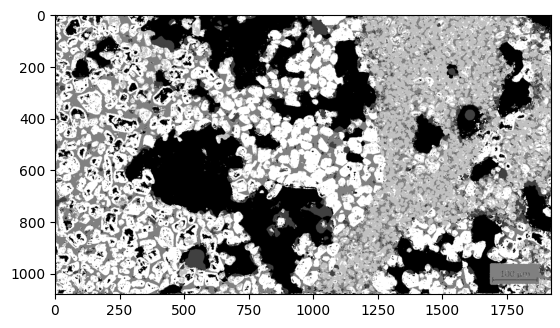

In [ ]:
#Test on a different image
#READ EXTERNAL IMAGE...
test_img = cv2.imread('/content/drive/MyDrive/Segmentazione/Immagini test/2201--20.jpg', cv2.IMREAD_COLOR)
# orig_test_img = test_img[28:1052, 448:1472]
# test_img = cv2.resize(orig_test_img, (SIZE_Y, SIZE_X))
#test_img = cv2.resize(test_img, (SIZE_Y, SIZE_X))
test_img_tq = cv2.cvtColor(test_img, cv2.COLOR_RGB2BGR)
test_img = test_img_tq / 127.5 - 1  # Normalizzazione tra -1 e 1
test_img = np.expand_dims(test_img, axis=0)
test_img_tq = np.expand_dims(test_img_tq, axis=0)

block1_pred, block2_pred = encoder_model(test_img)
block2_pred_upsampled = tf.image.resize(block2_pred, size=block1_pred.shape[1:3])
test_fused_features = Concatenate()([block1_pred, block2_pred_upsampled])
X_test_feature = test_fused_features.numpy().reshape(-1, test_fused_features.shape[3])

prediction = model.predict(X_test_feature)

#View and Save segmented image
prediction_image = prediction.reshape(new_x,new_y)
#prediction_image = prediction_image/255
plt.imshow(prediction_image, cmap='gray')
plt.imsave('image_segmented.jpg', prediction_image, cmap='gray')

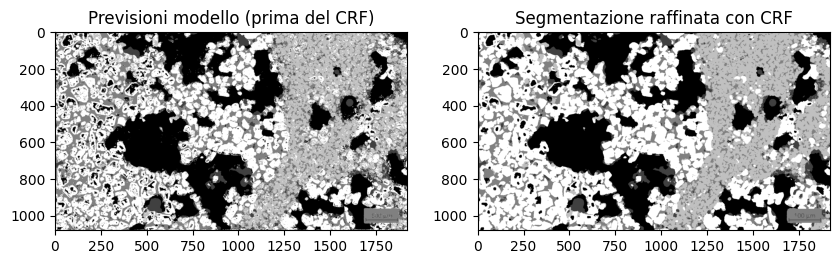

In [ ]:
#FUNZIONE CONDITIONAL RANDOM FIELDS: PERMETTE DI AFFINARE LA MASCHERA UTILIZZANDO LE RELAZIONI SPAZIALI DEI PIXEL

import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_labels, create_pairwise_gaussian, create_pairwise_bilateral
import numpy as np

# Funzione per applicare il CRF
def apply_crf(image, labels, n_labels):
    # Crea il modello CRF denso
    d = dcrf.DenseCRF2D(image.shape[1], image.shape[0], n_labels)

    # Definisci il potenziale unario basato sulle etichette previste
    # labels devono essere la mappa di etichette (output del modello di segmentazione)
    unary = unary_from_labels(labels, n_labels, gt_prob=0.8, zero_unsure=False)
    d.setUnaryEnergy(unary)

    # Crea un kernel gaussiano per lo smoothing spatial compatibile
    feats = create_pairwise_gaussian(sdims=(3, 3), shape=image.shape[:2])
    d.addPairwiseEnergy(feats, compat=5)

    # Crea un kernel bilaterale (smoothing spatial + colore) compatibile
    feats = create_pairwise_bilateral(sdims=(5, 5), schan=(15, 15, 15), img=image, chdim=2)
    d.addPairwiseEnergy(feats, compat=8)

    # Inferenzia
    Q = d.inference(10)  # Numero di iterazioni
    MAP = np.argmax(Q, axis=0).reshape((image.shape[0], image.shape[1]))

    return MAP

# Dopo la predizione del modello
predicted_labels = prediction
predicted_labels = predicted_labels.reshape(new_x, new_y)

# Ora applichiamo i CRF per migliorare la segmentazione
refined_labels = apply_crf(test_img_tq[0], predicted_labels, n_labels=5)  # Supponiamo 5 classi

# Visualizza il risultato prima e dopo l'applicazione del CRF
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title("Previsioni modello (prima del CRF)")
plt.imshow(predicted_labels, cmap='gray')

plt.subplot(1,2,2)
plt.title("Segmentazione raffinata con CRF")
plt.imshow(refined_labels, cmap='gray')
plt.show()

plt.imsave('maschera.jpg', refined_labels, cmap='plasma')

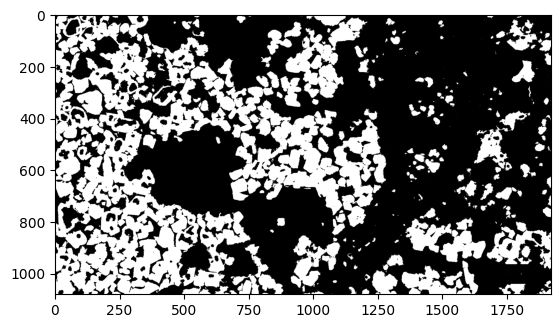

In [ ]:
# FUNZIONE PER OTTENERE LE MASCHERE BINARIE

masks = []

# Crea una maschera binaria per la classe i
mask = (refined_labels == 4).astype(np.uint8)  # 1 per i pixel di classe i, 0 per gli altri
#mask *= 255  # Se vuoi visualizzare la maschera in un'immagine (scala di grigi)
plt.imshow(mask, cmap='gray')
plt.imsave('maschera.jpg', mask, cmap='gray')

In [ ]:
plt.imshow(test_img_tq)
plt.imsave('originale.jpg', test_img_tq)

NameError: name 'orig_test_img' is not defined

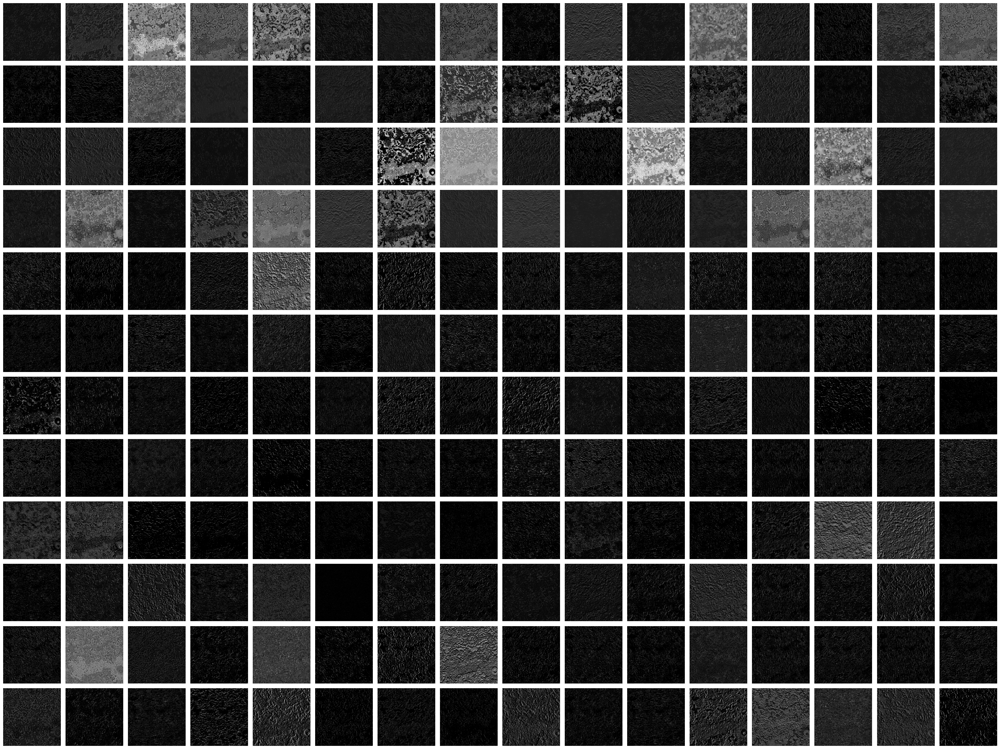

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'fused_features' has shape (11, 1024, 1024, 192)
feature_map_to_visualize = fused_features[2]  # Select the desired feature map

# Calculate the number of rows and columns for the subplot grid
num_cols = 16  # Adjust as needed
num_rows = int(np.ceil(feature_map_to_visualize.shape[-1] / num_cols))

# Create the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 2, num_rows * 2))  # Adjust figsize as needed

# Iterate over channels and plot each in a subplot
for i in range(feature_map_to_visualize.shape[-1]):
    row = i // num_cols
    col = i % num_cols
    axes[row, col].imshow(feature_map_to_visualize[:, :, i], cmap='gray')  # Or any other suitable colormap
    axes[row, col].axis('off')  # Turn off axis labels

plt.tight_layout()  # Adjust spacing between subplots
plt.show()